In [1]:
import visual_behavior_glm

In [2]:
import visual_behavior_glm.src.GLM_params as glm_params
import visual_behavior_glm.src.GLM_analysis_tools as gat
from visual_behavior_glm.src.glm import GLM
import matplotlib.pyplot as plt
import visual_behavior.data_access.loading as loading
import visual_behavior.database as db
import plotly.express as px

import pandas as pd
import numpy as np
import os

from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import seaborn as sns

In [3]:
%matplotlib inline


### get experiments_table

In [4]:
import visual_behavior.data_access.loading as loading

In [5]:
experiments_table = loading.get_filtered_ophys_experiment_table()
# sessions_table = loading.get_filtered_ophys_session_table()

In [6]:
expts_with_licks = [984551228, 1010530054, 881949066, 980673831, 1007929142, 933338719]

# 459777_940852658_Camk2a-tTA_VISp_175_OPHYS_3_images_A_CAM2P3
# 480753_984551228_Sst-IRES-Cre_VISp_275_OPHYS_2_images_B_passive_CAM2P3
# 498972_1010530054_Sst-IRES-Cre_VISp_275_OPHYS_2_images_B_passive_CAM2P3
# 435431_881949066_Vip-IRES-Cre_VISp_225_OPHYS_2_images_A_passive_MESO1
# 477202_980673831_Sst-IRES-Cre_VISp_275_OPHYS_2_images_B_passive_CAM2P3
# 495789_1007929142_Sst-IRES-Cre_VISp_275_OPHYS_2_images_A_passive_CAM2P3
# 467951_933338719_Vip-IRES-Cre_VISp_175_OPHYS_2_images_B_passive_CAM2P3

experiments_table.loc[expts_with_licks][['ophys_session_id','cre_line','session_type','equipment_name','exposure_number']]

,ophys_session_id,cre_line,session_type,equipment_name,exposure_number
ophys_experiment_id,,,,,
984551228,982980548,Sst-IRES-Cre,OPHYS_2_images_B_passive,CAM2P.3,0
1010530054,1010373053,Sst-IRES-Cre,OPHYS_2_images_B_passive,CAM2P.3,2
881949066,881094781,Vip-IRES-Cre,OPHYS_2_images_A_passive,MESO.1,0
980673831,979968637,Sst-IRES-Cre,OPHYS_2_images_B_passive,CAM2P.3,0
1007929142,1007733253,Sst-IRES-Cre,OPHYS_2_images_A_passive,CAM2P.3,0
933338719,932664150,Vip-IRES-Cre,OPHYS_2_images_B_passive,CAM2P.3,0


## get results for glm version 6

In [12]:
results_all = gat.retrieve_results(results_type='full')

In [13]:
results_all['glm_version'].unique()
#use v4

array(['3', '4_L2_optimize_by_session', '4_L2_fixed_lambda=1',
       '4_L2_optimize_by_cell', '2', '4_L2_opt_by_cell_tighter_grid',
       '4_L2_opt_by_session_tighter_grid', '5_L2_fixed_lambda=1',
       '5_L2_optimize_by_cell', '5_L2_optimize_by_session', '1',
       '6_L2_optimize_by_session', '6_L2_optimize_by_cell',
       'test_fixed_lambda=50'], dtype=object)

In [14]:
rs = gat.retrieve_results(search_dict = {'glm_version': '6_L2_optimize_by_cell'}, results_type='summary')
len(rs)

2976458

In [15]:
rs.keys()

Index(['_id', 'dropout', 'absolute_change_from_full', 'variance_explained',
       'variance_explained_full', 'fraction_change_from_full',
       'cell_specimen_id', 'adj_fraction_change_from_full',
       'adj_variance_explained', 'adj_variance_explained_full',
       'ophys_experiment_id', 'ophys_session_id', 'behavior_session_id',
       'container_id', 'project_code', 'container_workflow_state',
       'experiment_workflow_state', 'session_name', 'session_type',
       'equipment_name', 'date_of_acquisition', 'isi_experiment_id',
       'specimen_id', 'sex', 'age_in_days', 'full_genotype', 'reporter_line',
       'driver_line', 'imaging_depth', 'targeted_structure', 'published_at',
       'super_container_id', 'cre_line', 'session_tags', 'failure_tags',
       'exposure_number', 'model_outputs_available', 'location', 'has_events',
       'session_number', 'glm_version', 'entry_time_utc'],
      dtype='object')

### make a new column called 'identifier' that is {OPHYS_EXPERIMENT_ID}_{CELL_SPECIMEN_ID}. This will give each a unique ID

In [16]:
rs['identifier'] = rs['ophys_experiment_id'].astype(str) + '_' +  rs['cell_specimen_id'].astype(str)

In [17]:
rs

,_id,dropout,absolute_change_from_full,variance_explained,variance_explained_full,fraction_change_from_full,cell_specimen_id,adj_fraction_change_from_full,adj_variance_explained,adj_variance_explained_full,...,session_tags,failure_tags,exposure_number,model_outputs_available,location,has_events,session_number,glm_version,entry_time_utc,identifier
0,5f4fd605cb47f470c067babd,Full,0.000000,0.004557,0.004557,0.000000,994090625,0.000000,0.004557,0.004557,...,NaN,NaN,0,0,Vip_VISl_306,0,2,6_L2_optimize_by_cell,2020-09-02 17:27:33.890208,881949079_994090625
1,5f4fd605cb47f470c067babe,all-images,-0.004557,0.000000,0.004557,0.000000,994090625,0.000000,0.000000,0.004764,...,NaN,NaN,0,0,Vip_VISl_306,0,2,6_L2_optimize_by_cell,2020-09-02 17:27:33.893275,881949079_994090625
2,5f4fd605cb47f470c067babf,change,0.000035,0.004592,0.004557,0.000000,994090625,0.000000,0.000000,0.000000,...,NaN,NaN,0,0,Vip_VISl_306,0,2,6_L2_optimize_by_cell,2020-09-02 17:27:33.896009,881949079_994090625
3,5f4fd605cb47f470c067bac0,correct_rejects,0.000273,0.004830,0.004557,0.000000,994090625,0.000000,0.000000,0.000000,...,NaN,NaN,0,0,Vip_VISl_306,0,2,6_L2_optimize_by_cell,2020-09-02 17:27:33.898306,881949079_994090625
4,5f4fd605cb47f470c067bac1,face_motion_energy,0.019050,0.023607,0.004557,0.000000,994090625,0.000000,0.024064,0.004794,...,NaN,NaN,0,0,Vip_VISl_306,0,2,6_L2_optimize_by_cell,2020-09-02 17:27:33.900699,881949079_994090625
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2976453,5f528cd43ed30081f0e50395,single-running,-0.006422,0.002380,0.008802,0.000000,962559644,0.000000,0.002373,0.008918,...,NaN,NaN,0,1,Slc17a7_VISp_375,0,1,6_L2_optimize_by_cell,2020-09-04 18:52:04.340130,848697625_962559644
2976454,5f528cd43ed30081f0e50396,single-time,-0.008525,0.000276,0.008802,0.000000,962559644,0.000000,0.000276,0.008802,...,NaN,NaN,0,1,Slc17a7_VISp_375,0,1,6_L2_optimize_by_cell,2020-09-04 18:52:04.342484,848697625_962559644
2976455,5f528cd43ed30081f0e50397,single-visual,0.004420,0.013222,0.008802,-1.000000,962559644,-1.000000,0.013225,0.008960,...,NaN,NaN,0,1,Slc17a7_VISp_375,0,1,6_L2_optimize_by_cell,2020-09-04 18:52:04.345094,848697625_962559644
2976456,5f528cd43ed30081f0e50398,time,-0.000053,0.008749,0.008802,-0.006045,962559644,-0.006045,0.008749,0.008802,...,NaN,NaN,0,1,Slc17a7_VISp_375,0,1,6_L2_optimize_by_cell,2020-09-04 18:52:04.347741,848697625_962559644


### pivot the table to get it into a form for clustering

#### first get variance explained for full model to filter out poorly fit cells

In [18]:
model_output_type = 'variance_explained'
ve = rs.pivot(index='identifier',columns='dropout',values=model_output_type).reset_index()
ve


dropout,identifier,Full,all-images,beh_model,change,correct_rejects,face_motion_energy,false_alarms,hits,image0,...,single-post_licks,single-pre_lick_bouts,single-pre_licks,single-pupil,single-rewards,single-running,single-time,single-visual,time,visual
0,1000743008_1003146172,0.072681,0.063245,0.072519,0.072460,0.072680,0.069063,0.072656,0.072593,0.072301,...,0.004658,0.010744,0.007796,0.012572,0.006153,1.630847e-03,0.000000,0.048813,0.072684,0.057394
1,1000743008_1003146177,0.000085,0.000000,0.000152,0.000063,0.000078,0.003123,0.000083,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000137,5.912784e-08,0.000001,0.005165,0.000089,0.000000
2,1000743008_1003146180,0.050143,0.041531,0.050163,0.050247,0.050163,0.052713,0.050141,0.050076,0.049384,...,0.000705,0.005123,0.002094,0.008120,0.002019,8.762266e-05,0.000000,0.051150,0.050154,0.037421
3,1000743008_1003146183,0.259112,0.194622,0.261145,0.258583,0.259128,0.255834,0.259109,0.258857,0.259219,...,0.007008,0.017378,0.012024,0.046864,0.016591,6.398867e-03,0.000000,0.208586,0.260023,0.172651
4,1000743008_1003146186,0.137234,0.092302,0.137939,0.137212,0.137146,0.138285,0.137321,0.137306,0.136606,...,0.001733,0.008811,0.002874,0.026067,0.004361,0.000000e+00,0.000000,0.141416,0.137203,0.084443
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55285,995622557_994309997,0.019052,0.009407,NaN,0.019164,0.018992,0.022713,NaN,NaN,0.018502,...,NaN,NaN,NaN,0.002481,NaN,0.000000e+00,0.000255,0.022117,0.018919,0.008152
55286,995622557_994310003,0.284825,0.046074,NaN,0.284880,0.284540,0.273938,NaN,NaN,0.281022,...,NaN,NaN,NaN,0.000000,NaN,1.824736e-03,0.004668,0.259441,0.285455,0.044613
55287,995622557_996068361,0.002887,0.003335,NaN,0.003017,0.002895,0.009974,NaN,NaN,0.002945,...,NaN,NaN,NaN,0.001797,NaN,0.000000e+00,0.006859,0.001227,0.000000,0.003284
55288,995622557_996068370,0.000281,0.000221,NaN,0.000368,0.000275,0.003561,NaN,NaN,0.000392,...,NaN,NaN,NaN,0.000489,NaN,0.000000e+00,0.001093,0.002562,0.000000,0.000193


In [19]:
cells_to_include = ve[ve['Full']>0.01].identifier.values

order = np.argsort(ve[ve.identifier.isin(cells_to_include)==True]['Full'])
cell_order = cells_to_include[order]

len(cells_to_include)

34970

#### get fraction change in explained variance after dropout of each regressor

In [30]:
rs.keys()

Index(['_id', 'dropout', 'absolute_change_from_full', 'variance_explained',
       'variance_explained_full', 'fraction_change_from_full',
       'cell_specimen_id', 'adj_fraction_change_from_full',
       'adj_variance_explained', 'adj_variance_explained_full',
       'ophys_experiment_id', 'ophys_session_id', 'behavior_session_id',
       'container_id', 'project_code', 'container_workflow_state',
       'experiment_workflow_state', 'session_name', 'session_type',
       'equipment_name', 'date_of_acquisition', 'isi_experiment_id',
       'specimen_id', 'sex', 'age_in_days', 'full_genotype', 'reporter_line',
       'driver_line', 'imaging_depth', 'targeted_structure', 'published_at',
       'super_container_id', 'cre_line', 'session_tags', 'failure_tags',
       'exposure_number', 'model_outputs_available', 'location', 'has_events',
       'session_number', 'glm_version', 'entry_time_utc', 'identifier'],
      dtype='object')

In [60]:
# model_output_type = 'fraction_change_from_full'
model_output_type = 'adj_fraction_change_from_full'
rsp = rs.pivot(index='identifier',columns='dropout',values=model_output_type).reset_index()
rsp


dropout,identifier,Full,all-images,beh_model,change,correct_rejects,face_motion_energy,false_alarms,hits,image0,...,single-post_licks,single-pre_lick_bouts,single-pre_licks,single-pupil,single-rewards,single-running,single-time,single-visual,time,visual
0,1000743008_1003146172,0.0,-0.132833,-0.002252,-0.012288,0.000000,-0.048863,-0.069247,-0.005207,-0.030514,...,-0.086616,-0.169072,-0.117607,-0.173605,-0.362636,0.000000,0.0,-0.671217,0.000000,-0.210132
1,1000743008_1003146177,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
2,1000743008_1003146180,0.0,-0.170696,0.000000,0.000000,0.000000,0.000000,-0.032622,-0.002930,0.000000,...,0.000000,-0.118929,0.000000,-0.162006,-0.194188,0.000000,0.0,-1.000000,0.000000,-0.253638
3,1000743008_1003146183,0.0,-0.252744,0.000000,-0.006901,0.000000,-0.011429,-0.036082,-0.004157,-0.112368,...,-0.038102,-0.084072,-0.051367,-0.181473,-0.226330,-0.024685,0.0,-0.805014,0.000000,-0.333552
4,1000743008_1003146186,0.0,-0.329738,0.000000,0.000000,-0.015491,0.000000,0.000000,0.000000,0.000000,...,0.000000,-0.087899,0.000000,-0.190346,-0.153930,0.000000,0.0,-1.000000,-0.000226,-0.384151
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55285,995622557_994309997,0.0,-0.508017,NaN,0.000000,0.000000,0.000000,NaN,NaN,-0.122716,...,NaN,NaN,NaN,0.000000,NaN,0.000000,0.0,-1.000000,-0.006950,-0.572494
55286,995622557_994310003,0.0,-0.845221,NaN,0.000000,-0.077819,-0.040049,NaN,NaN,-0.088712,...,NaN,NaN,NaN,0.000000,NaN,0.000000,0.0,-0.911195,0.000000,-0.843607
55287,995622557_996068361,0.0,0.000000,NaN,0.000000,0.000000,0.000000,NaN,NaN,0.000000,...,NaN,NaN,NaN,0.000000,NaN,0.000000,0.0,0.000000,0.000000,0.000000
55288,995622557_996068370,0.0,0.000000,NaN,0.000000,0.000000,0.000000,NaN,NaN,0.000000,...,NaN,NaN,NaN,0.000000,NaN,0.000000,0.0,0.000000,0.000000,0.000000


In [61]:
tmp = ve.rename(columns={'Full':'varience_explained_full_model'})
rsp = rsp.merge(tmp[['identifier','varience_explained_full_model']], on=['identifier'])

#### filter out poorly fit cells 

In [62]:
# rsp = rsp[rsp.identifier.isin(cells_to_include)==True]

In [63]:
rs.keys()

Index(['_id', 'dropout', 'absolute_change_from_full', 'variance_explained',
       'variance_explained_full', 'fraction_change_from_full',
       'cell_specimen_id', 'adj_fraction_change_from_full',
       'adj_variance_explained', 'adj_variance_explained_full',
       'ophys_experiment_id', 'ophys_session_id', 'behavior_session_id',
       'container_id', 'project_code', 'container_workflow_state',
       'experiment_workflow_state', 'session_name', 'session_type',
       'equipment_name', 'date_of_acquisition', 'isi_experiment_id',
       'specimen_id', 'sex', 'age_in_days', 'full_genotype', 'reporter_line',
       'driver_line', 'imaging_depth', 'targeted_structure', 'published_at',
       'super_container_id', 'cre_line', 'session_tags', 'failure_tags',
       'exposure_number', 'model_outputs_available', 'location', 'has_events',
       'session_number', 'glm_version', 'entry_time_utc', 'identifier'],
      dtype='object')

### merge in the identifier, cre_line, session_type and equipment_name columns

In [64]:
rs.keys()

Index(['_id', 'dropout', 'absolute_change_from_full', 'variance_explained',
       'variance_explained_full', 'fraction_change_from_full',
       'cell_specimen_id', 'adj_fraction_change_from_full',
       'adj_variance_explained', 'adj_variance_explained_full',
       'ophys_experiment_id', 'ophys_session_id', 'behavior_session_id',
       'container_id', 'project_code', 'container_workflow_state',
       'experiment_workflow_state', 'session_name', 'session_type',
       'equipment_name', 'date_of_acquisition', 'isi_experiment_id',
       'specimen_id', 'sex', 'age_in_days', 'full_genotype', 'reporter_line',
       'driver_line', 'imaging_depth', 'targeted_structure', 'published_at',
       'super_container_id', 'cre_line', 'session_tags', 'failure_tags',
       'exposure_number', 'model_outputs_available', 'location', 'has_events',
       'session_number', 'glm_version', 'entry_time_utc', 'identifier'],
      dtype='object')

In [65]:
rspm = rsp.merge(rs[['identifier','cell_specimen_id','ophys_experiment_id','cre_line','session_type','imaging_depth','equipment_name','project_code','session_number','exposure_number','container_id']].drop_duplicates(),left_on='identifier',right_on='identifier',how='inner')
rspm

,identifier,Full,all-images,beh_model,change,correct_rejects,face_motion_energy,false_alarms,hits,image0,...,cell_specimen_id,ophys_experiment_id,cre_line,session_type,imaging_depth,equipment_name,project_code,session_number,exposure_number,container_id
0,1000743008_1003146172,0.0,-0.132833,-0.002252,-0.012288,0.000000,-0.048863,-0.069247,-0.005207,-0.030514,...,1003146172,1000743008,Sst-IRES-Cre,OPHYS_1_images_B,275,CAM2P.3,VisualBehaviorTask1B,1,0,999191979
1,1000743008_1003146177,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1003146177,1000743008,Sst-IRES-Cre,OPHYS_1_images_B,275,CAM2P.3,VisualBehaviorTask1B,1,0,999191979
2,1000743008_1003146180,0.0,-0.170696,0.000000,0.000000,0.000000,0.000000,-0.032622,-0.002930,0.000000,...,1003146180,1000743008,Sst-IRES-Cre,OPHYS_1_images_B,275,CAM2P.3,VisualBehaviorTask1B,1,0,999191979
3,1000743008_1003146183,0.0,-0.252744,0.000000,-0.006901,0.000000,-0.011429,-0.036082,-0.004157,-0.112368,...,1003146183,1000743008,Sst-IRES-Cre,OPHYS_1_images_B,275,CAM2P.3,VisualBehaviorTask1B,1,0,999191979
4,1000743008_1003146186,0.0,-0.329738,0.000000,0.000000,-0.015491,0.000000,0.000000,0.000000,0.000000,...,1003146186,1000743008,Sst-IRES-Cre,OPHYS_1_images_B,275,CAM2P.3,VisualBehaviorTask1B,1,0,999191979
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55285,995622557_994309997,0.0,-0.508017,NaN,0.000000,0.000000,0.000000,NaN,NaN,-0.122716,...,994309997,995622557,Sst-IRES-Cre,OPHYS_5_images_A_passive,275,CAM2P.4,VisualBehaviorTask1B,5,0,991913453
55286,995622557_994310003,0.0,-0.845221,NaN,0.000000,-0.077819,-0.040049,NaN,NaN,-0.088712,...,994310003,995622557,Sst-IRES-Cre,OPHYS_5_images_A_passive,275,CAM2P.4,VisualBehaviorTask1B,5,0,991913453
55287,995622557_996068361,0.0,0.000000,NaN,0.000000,0.000000,0.000000,NaN,NaN,0.000000,...,996068361,995622557,Sst-IRES-Cre,OPHYS_5_images_A_passive,275,CAM2P.4,VisualBehaviorTask1B,5,0,991913453
55288,995622557_996068370,0.0,0.000000,NaN,0.000000,0.000000,0.000000,NaN,NaN,0.000000,...,996068370,995622557,Sst-IRES-Cre,OPHYS_5_images_A_passive,275,CAM2P.4,VisualBehaviorTask1B,5,0,991913453


In [66]:
rspm.keys()

Index(['identifier', 'Full', 'all-images', 'beh_model', 'change',
       'correct_rejects', 'face_motion_energy', 'false_alarms', 'hits',
       'image0', 'image1', 'image2', 'image3', 'image4', 'image5', 'image6',
       'image7', 'image_expectation', 'intercept', 'misses', 'model_bias',
       'model_omissions1', 'model_task0', 'model_timing1D', 'omissions',
       'post_lick_bouts', 'post_licks', 'pre_lick_bouts', 'pre_licks', 'pupil',
       'rewards', 'running', 'single-all-images', 'single-beh_model',
       'single-change', 'single-correct_rejects', 'single-face_motion_energy',
       'single-false_alarms', 'single-hits', 'single-image0', 'single-image1',
       'single-image2', 'single-image3', 'single-image4', 'single-image5',
       'single-image6', 'single-image7', 'single-image_expectation',
       'single-misses', 'single-model_bias', 'single-model_omissions1',
       'single-model_task0', 'single-model_timing1D', 'single-omissions',
       'single-post_lick_bouts', 'singl

### add a column for session ID (1, 3, 4, or 6)

In [67]:
rspm.session_type.unique()

array(['OPHYS_1_images_B', 'OPHYS_5_images_B_passive',
       'OPHYS_2_images_B_passive', 'OPHYS_3_images_B', 'OPHYS_4_images_A',
       'OPHYS_5_images_A_passive', 'OPHYS_6_images_A', 'OPHYS_1_images_A',
       'OPHYS_3_images_A', 'OPHYS_2_images_A_passive', 'OPHYS_4_images_B',
       'OPHYS_1_images_G', 'OPHYS_6_images_B', 'OPHYS_3_images_G',
       'OPHYS_2_images_G_passive', 'OPHYS_4_images_H',
       'OPHYS_5_images_H_passive', 'OPHYS_6_images_H'], dtype=object)

In [68]:
# def map_session_types(session_type):
#     session_id = session_type[6:7]
#     return session_id


# rspm['session_id'] = rspm['session_type'].map(lambda st:map_session_types(st))
# rspm['session_id'].unique()

### save feature matrix to disk

In [69]:
# save = False
# if save:
#     rspm.to_csv('/allen/programs/braintv/workgroups/nc-ophys/visual_behavior/ophys_glm/fraction_change_var_explained_v_4_L2_fixed_lambda=1_2020.08.09.csv', index=False)

### get the column names to use for clustering

In [70]:
cols_for_clustering = [col for col in rspm.columns if col not in ['identifier','cre_line','session_type','equipment_name', 
                                                                  'session_id', 'imaging_depth','project_code','session_number','exposure_number']]
cols_for_clustering = [col for col in cols_for_clustering if col not in ['image0','image1','image2','image3',
                                                                         'image4','image5','image6','image7',
                                                                         'visual', 'Full']]
cols_for_clustering = [col for col in cols_for_clustering if 'single' not in col]

cols_for_clustering

['all-images',
 'beh_model',
 'change',
 'correct_rejects',
 'face_motion_energy',
 'false_alarms',
 'hits',
 'image_expectation',
 'intercept',
 'misses',
 'model_bias',
 'model_omissions1',
 'model_task0',
 'model_timing1D',
 'omissions',
 'post_lick_bouts',
 'post_licks',
 'pre_lick_bouts',
 'pre_licks',
 'pupil',
 'rewards',
 'running',
 'time',
 'varience_explained_full_model',
 'cell_specimen_id',
 'ophys_experiment_id',
 'container_id']

In [71]:
len(cols_for_clustering)

27

In [72]:
cols_for_clustering = [
 'all-images',
 'omissions',
 'pupil',
 'running',
 'rewards',
 'face_motion_energy',
 'image_expectation',
 'change',
 'hits',
 'misses',
 'correct_rejects',
 'false_alarms',
 'post_lick_bouts',
 'post_licks',
 'pre_lick_bouts',
 'pre_licks',
 'time',
 'model_bias',
 'model_omissions1',
 'model_task0',
 'model_timing1D',
 ]

In [73]:
len(cols_for_clustering)

21

### plot feature matrix

In [74]:
rspm[cols_for_clustering]

,all-images,omissions,pupil,running,rewards,face_motion_energy,image_expectation,change,hits,misses,...,false_alarms,post_lick_bouts,post_licks,pre_lick_bouts,pre_licks,time,model_bias,model_omissions1,model_task0,model_timing1D
0,-0.132833,-0.162997,-0.013081,-0.008816,-0.003584,-0.048863,-0.013510,-0.012288,-0.005207,-0.046783,...,-0.069247,0.000000,-0.00833,0.0,0.0,0.000000,-0.003319,-0.000260,-0.000150,0.0
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.037079,...,0.000000,0.000000,0.00000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0
2,-0.170696,-0.195614,0.000000,-0.000436,0.000000,0.000000,-0.042850,0.000000,-0.002930,0.000000,...,-0.032622,0.000000,0.00000,0.0,0.0,0.000000,0.000000,-0.000136,0.000000,0.0
3,-0.252744,-0.177618,-0.020175,0.000000,0.000000,-0.011429,-0.012612,-0.006901,-0.004157,0.000000,...,-0.036082,-0.001459,0.00000,0.0,0.0,0.000000,0.000000,-0.002370,0.000000,0.0
4,-0.329738,-0.105457,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.00000,0.0,0.0,-0.000226,0.000000,0.000000,-0.000683,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55285,-0.508017,-0.112422,0.000000,-0.002847,NaN,0.000000,-0.040333,0.000000,NaN,0.000000,...,NaN,NaN,NaN,NaN,NaN,-0.006950,NaN,NaN,NaN,NaN
55286,-0.845221,-0.009871,-0.034583,-0.000580,NaN,-0.040049,-0.001031,0.000000,NaN,0.000000,...,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN
55287,0.000000,0.000000,0.000000,0.000000,NaN,0.000000,0.000000,0.000000,NaN,0.000000,...,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN
55288,0.000000,0.000000,0.000000,0.000000,NaN,0.000000,0.000000,0.000000,NaN,0.000000,...,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN


Text(0.5, 1, 'GLM feature matrix')

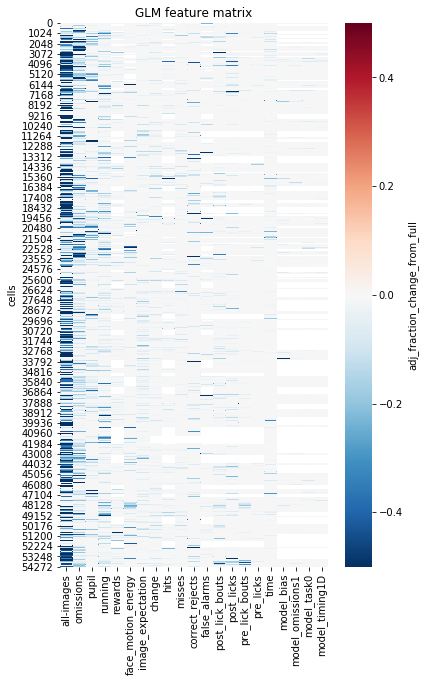

In [75]:
feature_matrix = rspm[cols_for_clustering]
fig, ax = plt.subplots(figsize=(6,10))
ax = sns.heatmap(feature_matrix, vmin=-0.5, vmax=0.5, center=0, cmap='RdBu_r', ax=ax, cbar_kws={'label':model_output_type})
ax.set_ylabel('cells')
ax.set_title('GLM feature matrix')

Text(0.5, 1, 'GLM feature matrix')

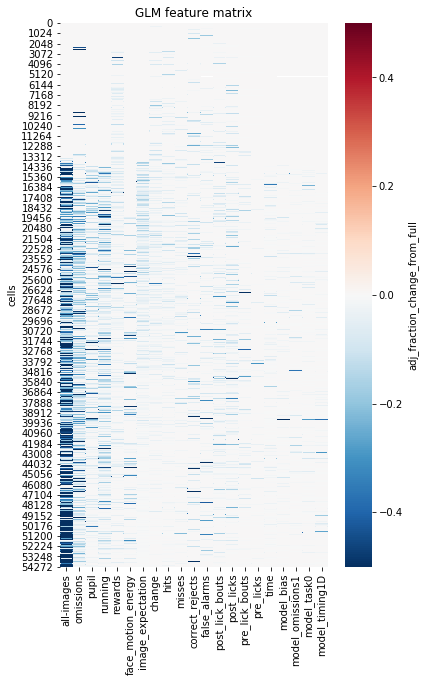

In [76]:
feature_matrix = rspm.sort_values('varience_explained_full_model').reset_index()[cols_for_clustering]
fig, ax = plt.subplots(figsize=(6,10))
ax = sns.heatmap(feature_matrix, vmin=-0.5, vmax=0.5, cmap='RdBu_r', center=0, ax=ax, cbar_kws={'label':model_output_type})
ax.set_ylabel('cells')
ax.set_title('GLM feature matrix')

Text(0.5, 1, 'GLM feature matrix')

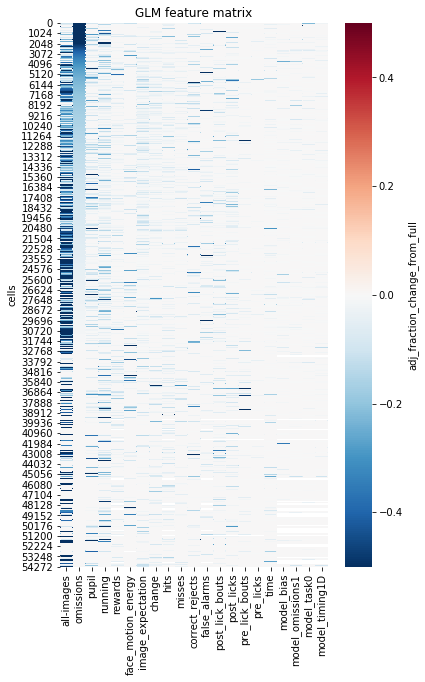

In [77]:
feature_matrix = rspm.sort_values('omissions').reset_index()[cols_for_clustering]
fig, ax = plt.subplots(figsize=(6,10))
ax = sns.heatmap(feature_matrix, vmin=-0.5, vmax=0.5, cmap='RdBu_r', ax=ax, cbar_kws={'label':model_output_type})
ax.set_ylabel('cells')
ax.set_title('GLM feature matrix')

In [78]:
feature_matrix.dropna()

,all-images,omissions,pupil,running,rewards,face_motion_energy,image_expectation,change,hits,misses,...,false_alarms,post_lick_bouts,post_licks,pre_lick_bouts,pre_licks,time,model_bias,model_omissions1,model_task0,model_timing1D
4,-0.464990,-1.0,-0.014187,-0.042853,-0.040926,0.0,-0.007808,0.000000,-0.01801,0.000000,...,-0.006941,0.000000,0.000000,0.0,0.0,-0.0111,-0.014593,0.000000,0.000000,-0.010054
5,0.000000,-1.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.000000,0.000000,0.0,0.0,0.0000,0.000000,0.000000,0.000000,0.000000
9,-0.010929,-1.0,-0.029408,-0.037761,0.000000,0.0,0.000000,0.000000,0.00000,-0.036582,...,0.000000,0.000000,0.000000,0.0,0.0,0.0000,0.000000,0.000000,-0.028448,0.000000
10,-0.498605,-1.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.000000,0.000000,0.0,0.0,0.0000,-0.020863,0.000000,0.000000,0.000000
15,0.000000,-1.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.000000,0.000000,0.0,0.0,0.0000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54310,-0.933211,0.0,0.000000,-0.014705,0.000000,0.0,-0.000454,-0.054806,0.00000,-0.008879,...,-0.053817,-0.011124,-0.165561,0.0,0.0,0.0000,0.000000,0.000000,0.000000,0.000000
54311,-0.166952,0.0,-0.094825,-0.156761,0.000000,0.0,-0.010249,0.000000,0.00000,0.000000,...,0.000000,0.000000,-0.035596,0.0,0.0,0.0000,-0.019109,0.000000,0.000000,-0.003842
54312,-1.000000,0.0,-0.002438,-0.001635,0.000000,0.0,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.000000,0.000000,0.0,0.0,0.0000,-0.038278,-0.020515,0.000000,0.000000
54313,-0.759228,0.0,-0.012539,-0.022745,0.000000,0.0,0.000000,0.000000,0.00000,-0.037939,...,0.000000,0.000000,0.000000,0.0,0.0,0.0000,-0.033373,-0.009989,0.000000,-0.021803


In [79]:
# feature_matrix = rspm.sort_values('omissions').reset_index()[cols_for_clustering]
# fig, ax = plt.subplots(figsize=(6,10))
# ax = sns.clustermap(feature_matrix.dropna(), vmin=-0.5, vmax=0.5, cmap='RdBu_r', ax=ax, cbar_kws={'label':model_output_type})
# ax.set_ylabel('cells')
# ax.set_title('clustered GLM feature matrix')

### plot single cell feature vectors across sessions

In [80]:
df = rspm[rspm.project_code.isin(['VisualBehavior', 'VisualBehaviorTask1B'])]

In [81]:
cell_specimen_ids = df.cell_specimen_id.unique()

In [82]:
cre_lines = df.cre_line.unique()

In [83]:
matched_cells = [cell_specimen_id for cell_specimen_id in cell_specimen_ids if len(df[df.cell_specimen_id==cell_specimen_id])>=3]

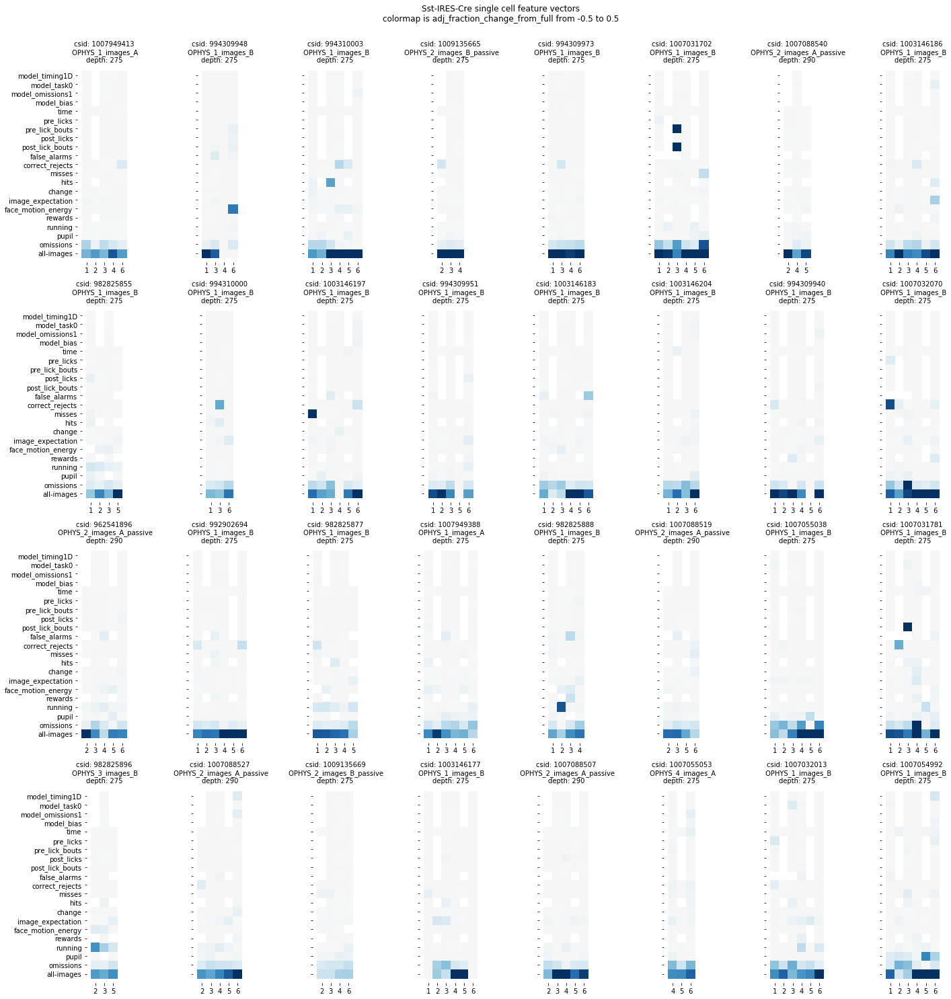

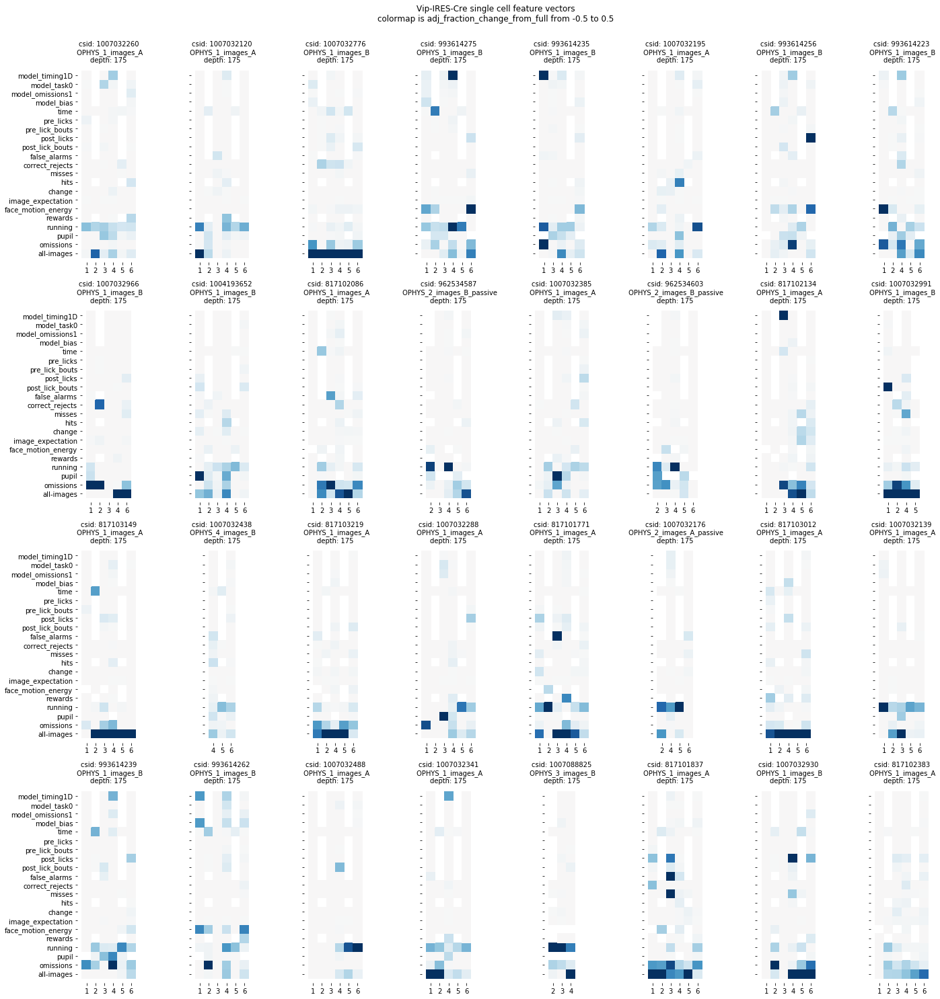

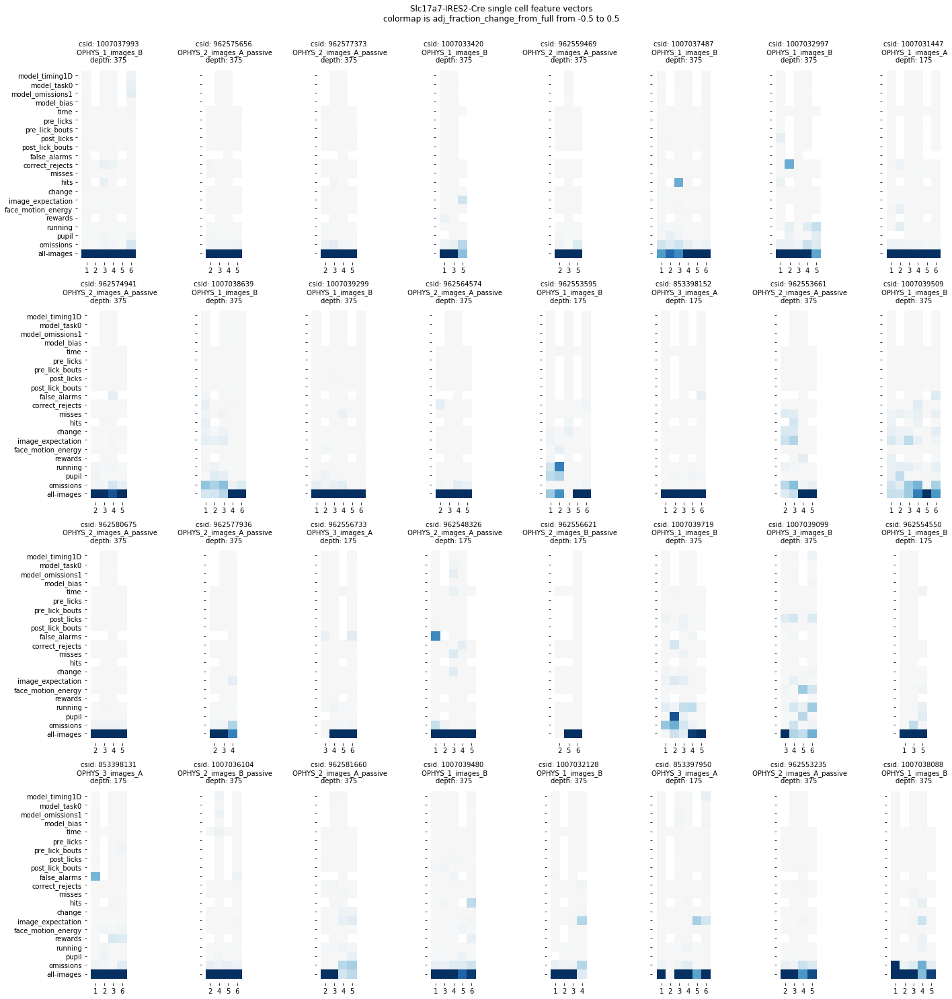

In [87]:
session_numbers = np.sort(df.session_number.unique())

for cre_line in cre_lines: 
    nrows = 4 
    ncols = 8
    fig, ax = plt.subplots(nrows,ncols, figsize=(20,20), sharey=True)
    ax = ax.ravel()
    cre_df = df[df.cell_specimen_id.isin(matched_cells)&(df.cre_line==cre_line)]
    cre_df = cre_df.sort_values(by='varience_explained_full_model', ascending=False)
    cre_matched_cells = cre_df.cell_specimen_id.unique()

    for i,cell_specimen_id in enumerate(cre_matched_cells[:(nrows*ncols)]):
        cdf = df[df.cell_specimen_id==cell_specimen_id]
        ax[i] = sns.heatmap(data=cdf.set_index('session_number')[cols_for_clustering].sort_values(by='session_number').T, 
                            vmin=-0.5, vmax=0.5, cmap='RdBu_r', square=True, ax=ax[i], cbar=False)
#         ax[i].imshow(cdf[cols_for_clustering].values.T, vmin=-0.5, vmax=0.5, cmap='RdBu_r',)
        ax[i].set_xlim(-0.5,len(cdf)+0.5)
        ax[i].set_xlabel('')
#         ax[i].set_xticks(np.arange(0,len(session_numbers),1))
#         ax[i].set_xticklabels(session_numbers)
        ax[i].set_ylim(-0.5,len(cols_for_clustering)+0.5)
        ax[i].set_yticks(np.arange(0.5,len(cols_for_clustering)+0.5,1))
        ax[i].set_yticklabels(cols_for_clustering)
#         ax[i].set_yticklabels('') 
        ax[i].set_title('csid: '+str(cell_specimen_id)+'\n '+cdf.session_type.values[0]+'\ndepth: '+str(int(cdf.imaging_depth.mean())), fontsize=10)

#     for y in np.arange(0,nrows*ncols,ncols):
#         ax[y].set_xlabel('session #', fontsize=10)

#     for x in range(nrows):
#         ax[(nrows*ncols-x)-1].set_yticks(np.arange(len(cols_for_clustering)))  
#         ax[(nrows*ncols-x)-1].set_yticklabels(cols_for_clustering, rotation=0)

    plt.suptitle(cre_line+' single cell feature vectors\ncolormap is '+model_output_type+' from -0.5 to 0.5', x=0.52, y=1.03, horizontalalignment='center')
    fig.tight_layout()

### characterize median change across sessions

In [85]:
df = rspm[rspm.project_code.isin(['VisualBehavior', 'VisualBehaviorTask1B'])]

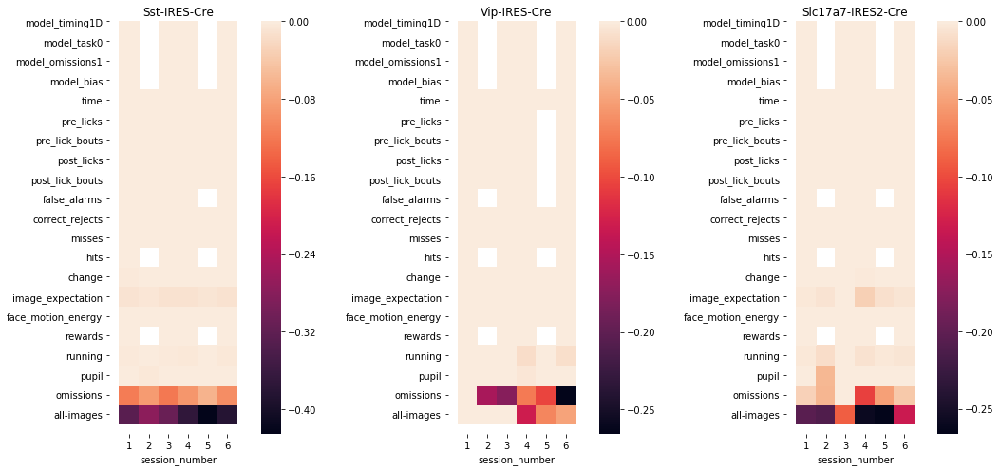

In [88]:
fig, ax = plt.subplots(1,3,figsize=(15,7))
for i,cre_line in enumerate(cre_lines):
    tmp = df[df.cre_line==cre_line]
    ax[i] = sns.heatmap(data=tmp.groupby(['session_number']).median()[cols_for_clustering].T, 
                        ax=ax[i], square=True)
    ax[i].set_xlim(-0.5,len(tmp.session_number.unique())+0.5)
    ax[i].set_ylim(-0.5,len(cols_for_clustering)-0.5)
    ax[i].set_yticks(np.arange(0.5,len(cols_for_clustering)+0.5,1))
    ax[i].set_yticklabels(cols_for_clustering);
    ax[i].set_title(cre_line)
fig.tight_layout()

Sst-IRES-Cre 9
Vip-IRES-Cre 10
Slc17a7-IRES2-Cre 18


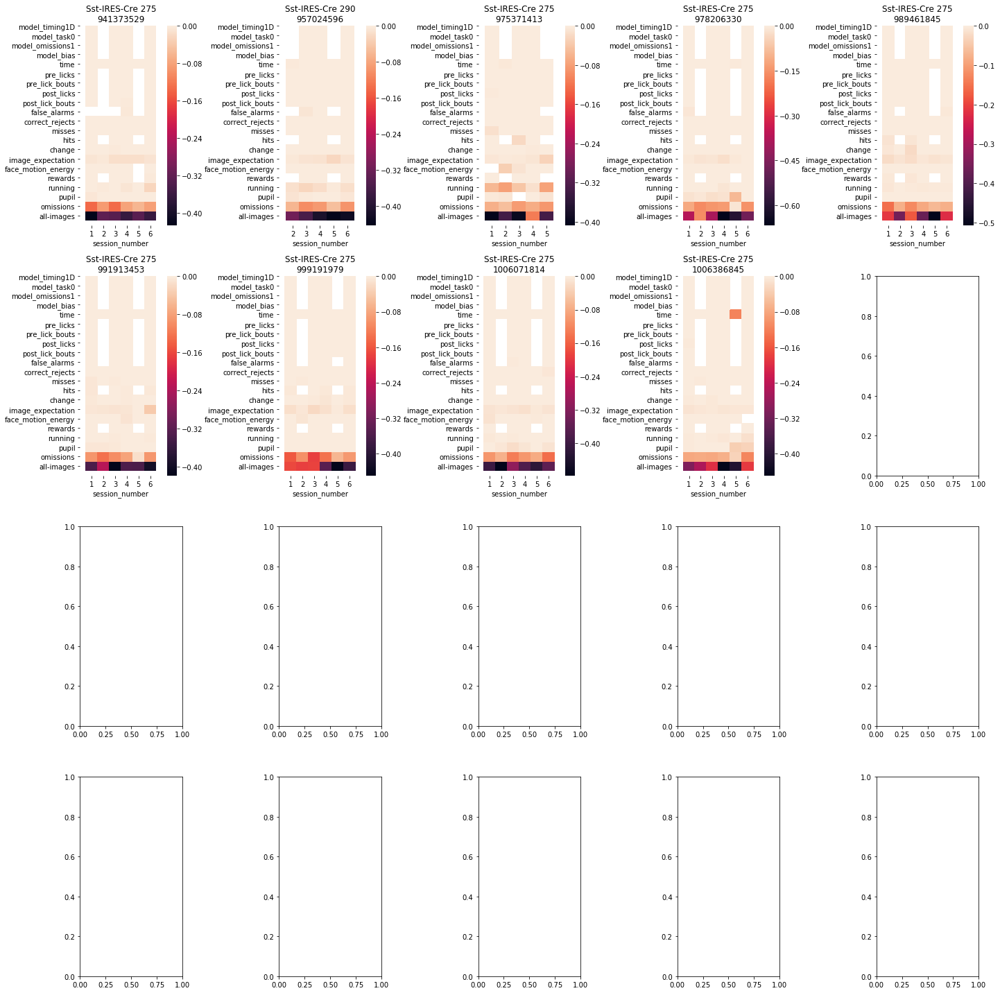

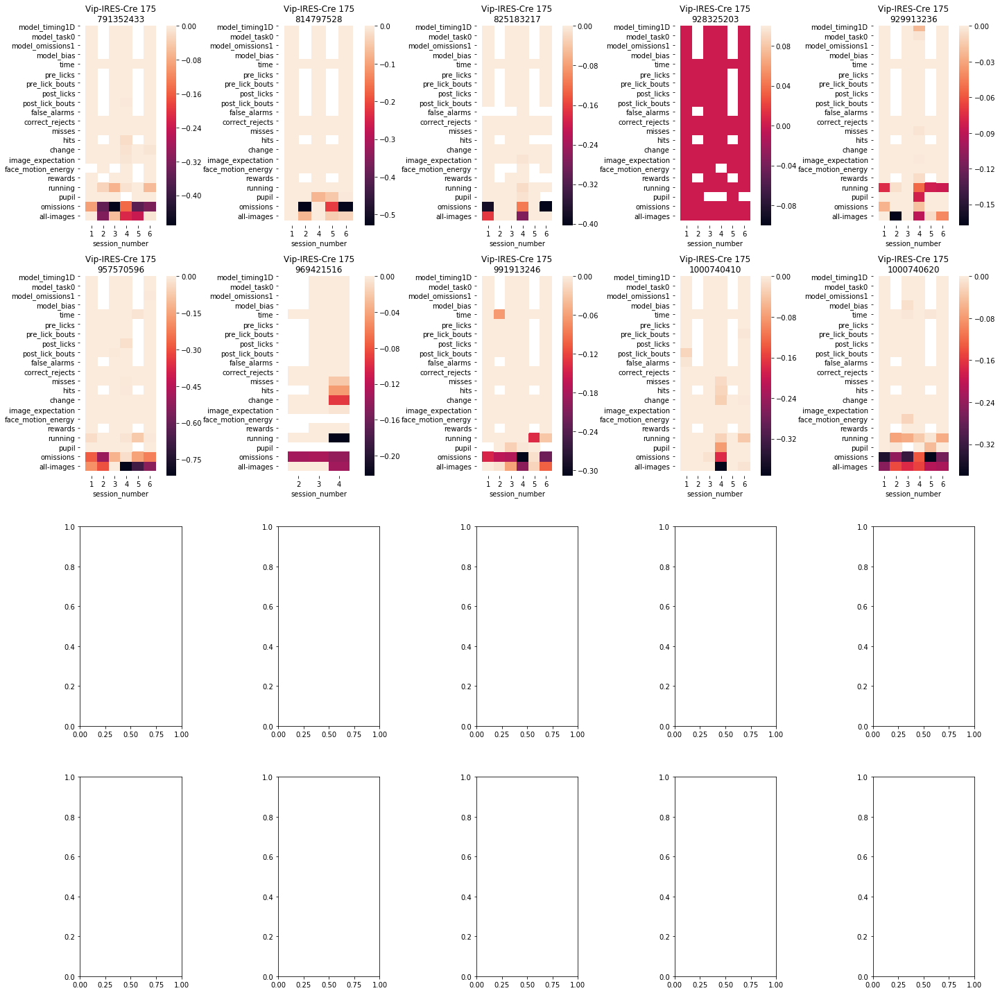

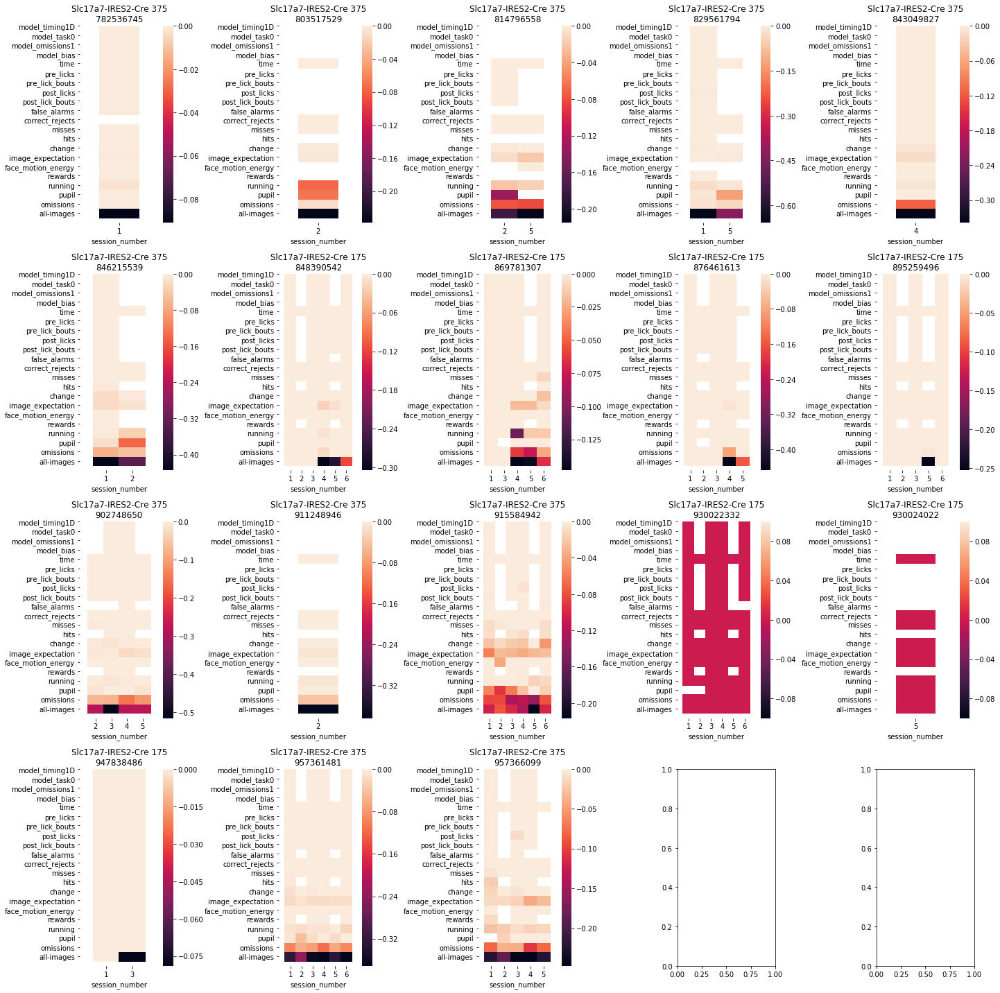

In [94]:
df = rspm[rspm.project_code.isin(['VisualBehavior', 'VisualBehaviorTask1B'])]


for c,cre_line in enumerate(cre_lines):
    tmp = df[(df.cre_line==cre_line)]
    containers = np.sort(tmp.container_id.unique())
    print(cre_line, len(containers))
    fig, ax = plt.subplots(4,5, figsize=(20,20))
    ax = ax.ravel()
    for i,container_id in enumerate(containers):
        cdf = tmp[(tmp.container_id==container_id)]
        ax[i] = sns.heatmap(data=cdf.groupby(['session_number']).median()[cols_for_clustering].T, ax=ax[i])
        ax[i].set_xlim(-0.5,len(cdf.session_number.unique())+0.5)
        ax[i].set_ylim(-0.5,len(cols_for_clustering)-0.5)
        ax[i].set_yticks(np.arange(0.5,len(cols_for_clustering)+0.5,1))
        ax[i].set_yticklabels(cols_for_clustering);
        ax[i].set_title(cre_line+' '+str(int(cdf.imaging_depth.mean()))+'\n'+str(container_id))
    fig.tight_layout()

In [ ]:
session_numbers = np.sort(df.session_number.unique())

for cre_line in cre_lines: 
    nrows = 4 
    ncols = 8
    fig, ax = plt.subplots(nrows,ncols, figsize=(20,20), sharey=True)
    ax = ax.ravel()
    cre_df = df[df.cell_specimen_id.isin(matched_cells)&(df.cre_line==cre_line)]
    cre_df = cre_df.sort_values(by='varience_explained_full_model', ascending=False)
    cre_matched_cells = cre_df.cell_specimen_id.unique()

    for i,cell_specimen_id in enumerate(cre_matched_cells[:(nrows*ncols)]):
        cdf = df[df.cell_specimen_id==cell_specimen_id]
        ax[i] = sns.heatmap(data=cdf.set_index('session_number')[cols_for_clustering].sort_values(by='session_number').T, 
                            vmin=-0.5, vmax=0.5, cmap='RdBu_r', square=True, ax=ax[i], cbar=False)
#         ax[i].imshow(cdf[cols_for_clustering].values.T, vmin=-0.5, vmax=0.5, cmap='RdBu_r',)
        ax[i].set_xlim(-0.5,len(cdf)-0.5)
        ax[i].set_xlabel('')
#         ax[i].set_xticks(np.arange(0,len(session_numbers),1))
#         ax[i].set_xticklabels(session_numbers)
        ax[i].set_ylim(-0.5,len(cols_for_clustering)-0.5)
        ax[i].set_yticks(np.arange(0,len(cols_for_clustering),1))
        ax[i].set_yticklabels(cols_for_clustering)
#         ax[i].set_yticklabels('') 
        ax[i].set_title('csid: '+str(cell_specimen_id)+'\n '+cdf.session_type.values[0]+'\ndepth: '+str(int(cdf.imaging_depth.mean())), fontsize=10)

#     for y in np.arange(0,nrows*ncols,ncols):
#         ax[y].set_xlabel('session #', fontsize=10)

#     for x in range(nrows):
#         ax[(nrows*ncols-x)-1].set_yticks(np.arange(len(cols_for_clustering)))  
#         ax[(nrows*ncols-x)-1].set_yticklabels(cols_for_clustering, rotation=0)

    plt.suptitle(cre_line+' single cell feature vectors\ncolormap is '+model_output_type+' from -0.5 to 0.5', x=0.52, y=1.03, horizontalalignment='center')
    fig.tight_layout()

### basic characterization 

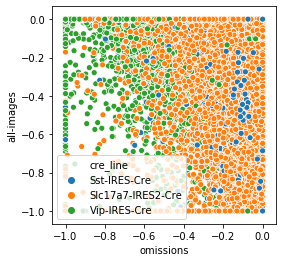

In [95]:
fig, ax = plt.subplots(figsize=(4,4))
ax = sns.scatterplot(data=rspm, x='omissions', y='all-images', hue='cre_line', ax=ax)


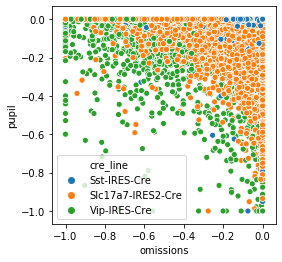

In [96]:
fig, ax = plt.subplots(figsize=(4,4))
ax = sns.scatterplot(data=rspm, x='omissions', y='pupil', hue='cre_line', ax=ax)


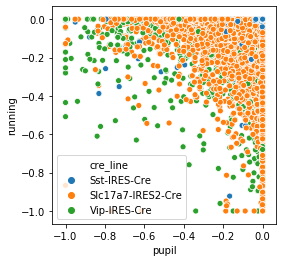

In [97]:
fig, ax = plt.subplots(figsize=(4,4))
ax = sns.scatterplot(data=rspm, x='pupil', y='running', hue='cre_line', ax=ax)


In [98]:
colors = sns.color_palette()
colors = [colors[0], colors[2], colors[3]]
cre_lines = np.sort(rspm.cre_line.unique())

C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



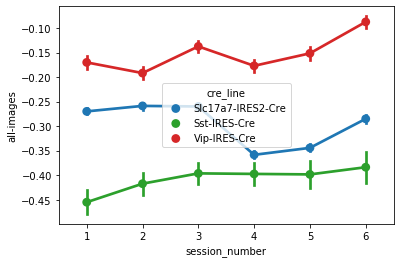

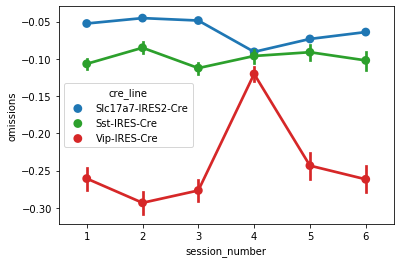

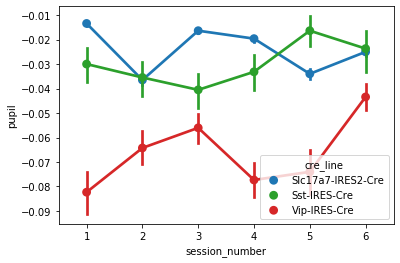

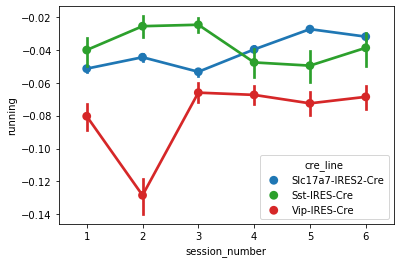

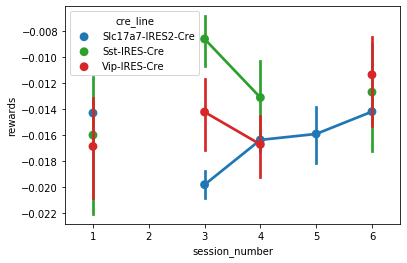

...

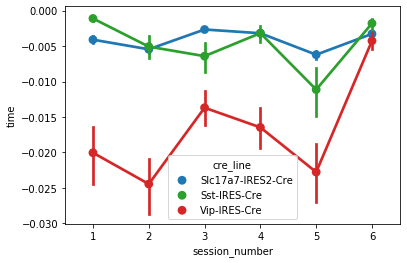

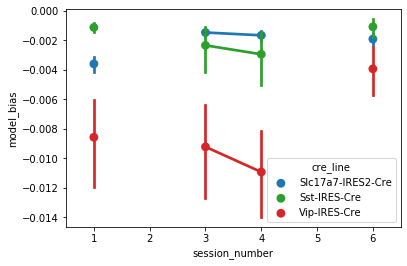

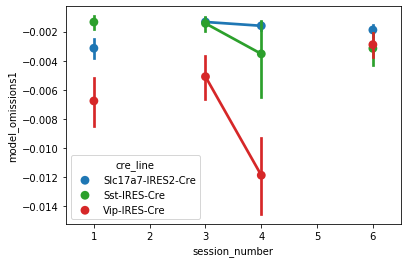

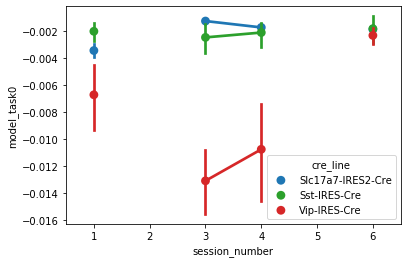

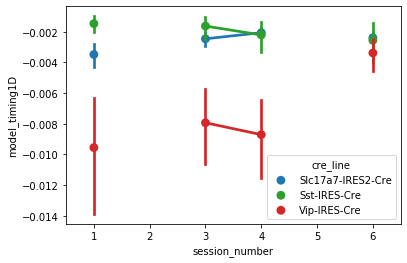

In [100]:
for metric in cols_for_clustering:
    fig, ax = plt.subplots(figsize=(6,4))
    sns.pointplot(data=rspm, x='session_number', y=metric, hue='cre_line', hue_order=cre_lines, palette=colors, ax=ax)

In [102]:
cre_lines = np.sort(rspm.cre_line.unique())
session_numbers = np.sort(rspm.session_number.unique())

cre_line = cre_lines[0]
session_number = session_numbers[0]

In [109]:
def get_colors_for_session_numbers():
    reds = sns.color_palette('Reds_r', 6)[::2]
    blues = sns.color_palette('Blues_r', 6)[::2]
    return reds + blues

In [110]:
colors = get_colors_for_session_numbers()
# colors = [c[0], c[2], c[3], c[5]]

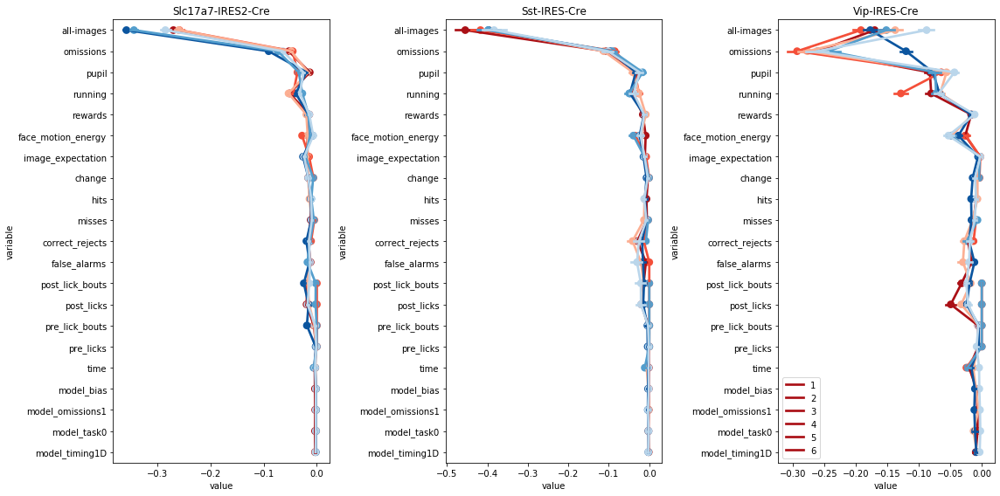

In [112]:
colors = get_colors_for_session_numbers()
fig, ax = plt.subplots(1,3, figsize=(16, 8))
for i,cre_line in enumerate(cre_lines): 
    for c,session_number in enumerate(session_numbers): 
        data = rspm[(rspm.cre_line==cre_line)&(rspm.session_number==session_number)][cols_for_clustering].melt()
        ax[i] = sns.pointplot(data=data, x='value', y='variable', ax=ax[i], color=colors[c], )
    ax[i].set_title(cre_line)
plt.legend(labels=session_numbers)
fig.tight_layout()

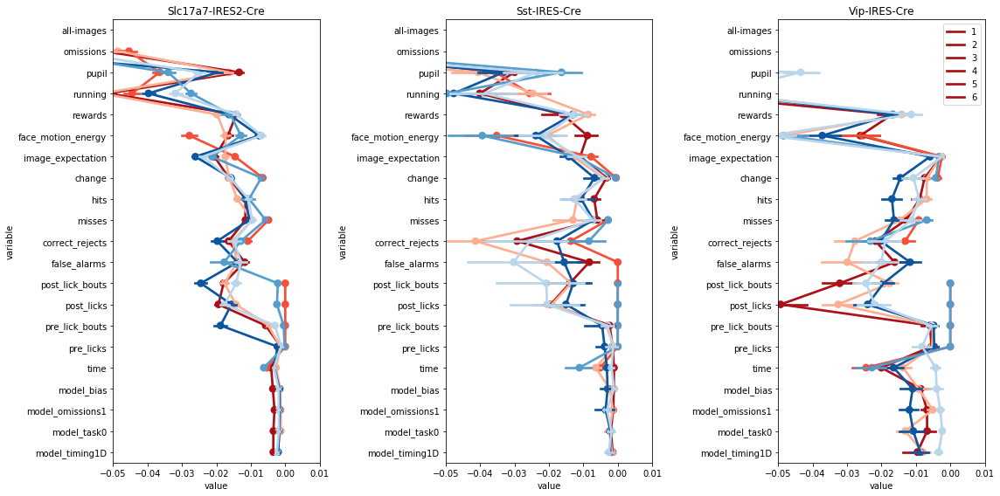

In [116]:
colors = get_colors_for_session_numbers()
fig, ax = plt.subplots(1,3, figsize=(16, 8))
for i,cre_line in enumerate(cre_lines): 
    for c,session_number in enumerate(session_numbers): 
        data = rspm[(rspm.cre_line==cre_line)&(rspm.session_number==session_number)][cols_for_clustering].melt()
        ax[i] = sns.pointplot(data=data, x='value', y='variable', ax=ax[i], color=colors[c], )
    ax[i].set_title(cre_line)
    ax[i].set_xlim(-0.05, 0.01)
plt.legend(labels=session_numbers)
fig.tight_layout()

In [ ]:
g = sns.PairGrid(rspm[cols_for_clustering+['cre_line']], hue="cre_line")
g.map_diag(plt.hist)
g.map_offdiag(plt.scatter)
g.add_legend();

### PCA on the feature matrix 

In [128]:
pca_result.shape

(18915, 21)

In [129]:
data.shape

(18915, 76)

In [133]:
pca_result[:,0].shape

(18915,)

In [134]:
data.shape

(18915, 76)

In [179]:
data = rspm.dropna()
n_features = len(cols_for_clustering)
n_components = len(cols_for_clustering)
pca = PCA(n_components=n_components)
pca_result = pca.fit_transform(data[cols_for_clustering].values)
data['pc1'] = pca_result[:,0]
data['pc2'] = pca_result[:,1] 
data['pc3'] = pca_result[:,2]
print('Explained variation per principal component: {}'.format(pca.explained_variance_ratio_))
 

Explained variation per principal component: [0.60860708 0.13267198 0.0477267  0.03053318 0.02756328 0.02379848
 0.02310602 0.020284   0.0159427  0.01350482 0.01339069 0.01014864
 0.00839636 0.00661698 0.00468193 0.00443659 0.00221219 0.00208872
 0.0017385  0.00155124 0.00099992]


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = va

### plot explained variance for PCs

In [138]:
np.cumsum(pca.explained_variance_ratio_)

array([0.60860708, 0.74127906, 0.78900575, 0.81953893, 0.84710221,
       0.87090069, 0.89400671, 0.91429071, 0.93023341, 0.94373823,
       0.95712892, 0.96727756, 0.97567392, 0.9822909 , 0.98697283,
       0.99140942, 0.99362161, 0.99571034, 0.99744884, 0.99900008,
       1.        ])

In [139]:
np.searchsorted(np.cumsum(pca.explained_variance_ratio_), .90)

7

In [140]:
np.searchsorted(np.cumsum(pca.explained_variance_ratio_), .95)

10

Text(0.5, 1.0, 'first 10 PCs explain >95% of the variance')

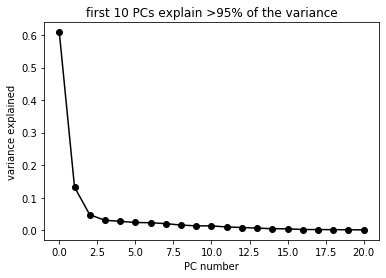

In [141]:
fig,ax=plt.subplots()
ax.plot(
    np.arange(n_components),
    pca.explained_variance_ratio_,
    'o-k'
)
ax.set_xlabel('PC number')
ax.set_ylabel('variance explained')
ax.set_title('first 10 PCs explain >95% of the variance')

### what are the PCs? 

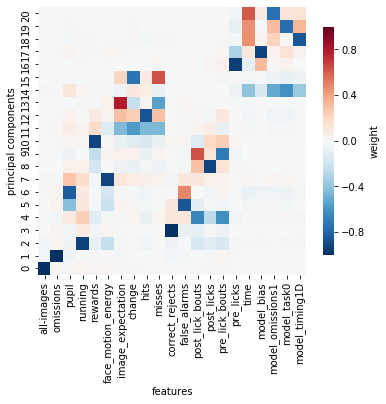

In [142]:
fig, ax = plt.subplots(figsize=(6,6))
ax = sns.heatmap(pca.components_, vmin=-1, vmax=1, cmap='RdBu_r', ax=ax, square=True,
                 robust=True, cbar_kws={"drawedges": False, "shrink": 0.7, "label": 'weight'})
ax.set_ylabel('principal components')
ax.set_xlabel('features')
# ax.set_title('principal axes in feature space \n(directions of maximum variance in the data)')
ax.set_ylim(0, n_components)
ax.set_xticklabels(cols_for_clustering, rotation=90);

In [143]:
pca.components_.shape

(21, 21)

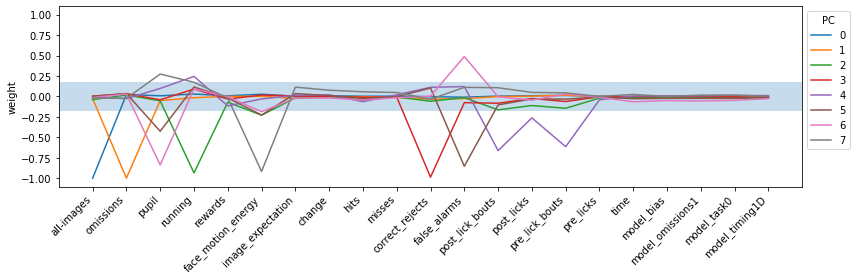

In [144]:
fig,ax=plt.subplots(figsize=(12,4))
N_PCs = 8
for PC in range(N_PCs):
    ax.plot(pca.components_[PC,:])
ax.legend(np.arange(N_PCs), title='PC', bbox_to_anchor=(1,1))
ax.axhspan(1/np.sqrt(32), -1/np.sqrt(32), zorder=-np.inf, alpha=0.25)
ax.set_xticks(np.arange(len(cols_for_clustering)))
ax.set_xticklabels(cols_for_clustering, rotation=45, ha='right')
ax.set_ylabel('weight')
ax.set_ylim(-1.1,1.1)
fig.tight_layout()


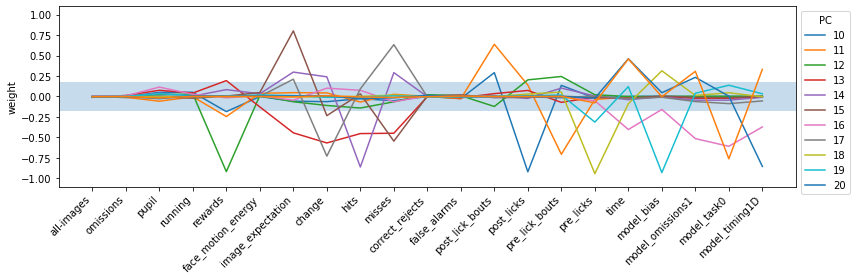

In [146]:
fig,ax=plt.subplots(figsize=(12,4))
for PC in range(8,20):
    ax.plot(pca.components_[PC,:])
ax.legend(np.arange(10,21), title='PC', bbox_to_anchor=(1,1))
ax.axhspan(1/np.sqrt(32), -1/np.sqrt(32), zorder=-np.inf, alpha=0.25)
ax.set_xticks(np.arange(len(cols_for_clustering)))
ax.set_xticklabels(cols_for_clustering, rotation=45, ha='right')
ax.set_ylabel('weight')
ax.set_ylim(-1.1,1.1)
fig.tight_layout()


### plot covariance matrix 

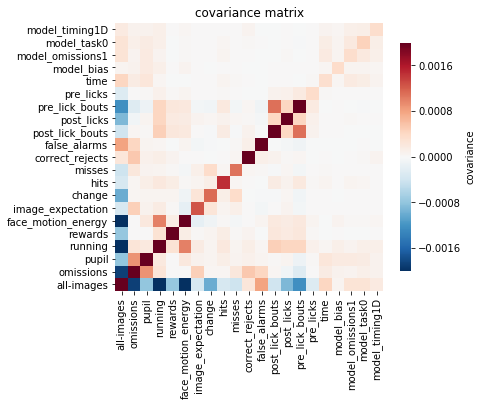

In [150]:
fig, ax = plt.subplots(figsize=(6,6))
ax = sns.heatmap(pca.get_covariance(), vmin=-0.002, vmax=0.002, cmap='RdBu_r', ax=ax, square=True,
                 robust=True, cbar_kws={"drawedges": False, "shrink": 0.7, "label": 'covariance'})
ax.set_title('covariance matrix')
ax.set_ylim(0, n_features)
ax.set_xticklabels(cols_for_clustering, rotation=90);
ax.set_yticklabels(cols_for_clustering, rotation=0);

### plot PCA result 

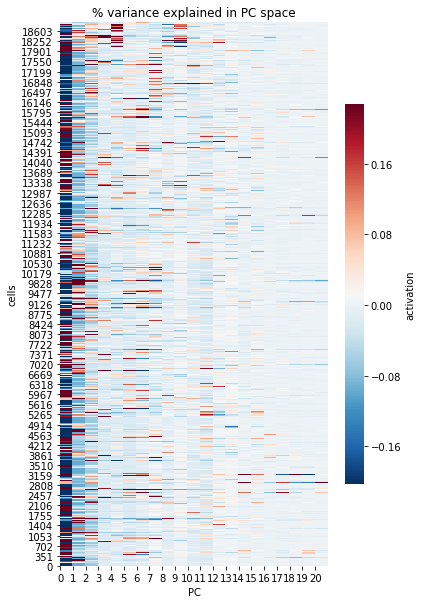

In [151]:
fig, ax = plt.subplots(figsize=(6,10))
ax = sns.heatmap(pca_result, cmap='RdBu_r', ax=ax, 
                 robust=True, cbar_kws={"drawedges": False, "shrink": 0.7, "label": 'activation'})
ax.set_ylabel('cells')
ax.set_xlabel('PC')
ax.set_title('% variance explained in PC space')
ax.set_ylim(0, pca_result.shape[0])
ax.set_xlim(0, pca_result.shape[1])
ax.set_xticks(np.arange(0, pca_result.shape[1]));
# ax.set_xticklabels(cols_for_clustering, rotation=90);

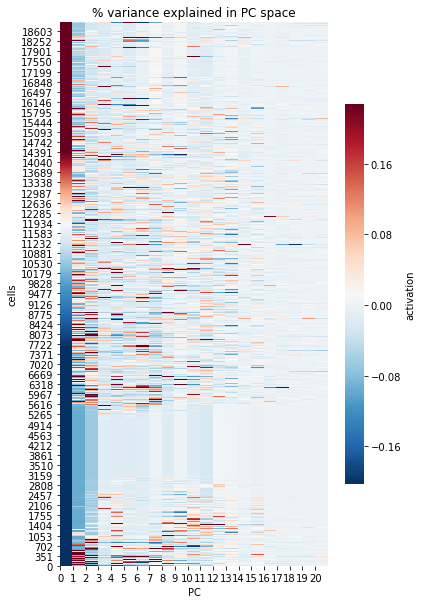

In [152]:
fig, ax = plt.subplots(figsize=(6,10))
ax = sns.heatmap(pca_result[np.argsort(pca_result[:,0])], cmap='RdBu_r', ax=ax, 
                 robust=True, cbar_kws={"drawedges": False, "shrink": 0.7, "label": 'activation'})
ax.set_ylabel('cells')
ax.set_xlabel('PC')
ax.set_title('% variance explained in PC space')
ax.set_ylim(0, pca_result.shape[0])
ax.set_xlim(0, pca_result.shape[1])
ax.set_xticks(np.arange(0, pca_result.shape[1]));
# ax.set_xticklabels(cols_for_clustering, rotation=90);

### plot data in PC space

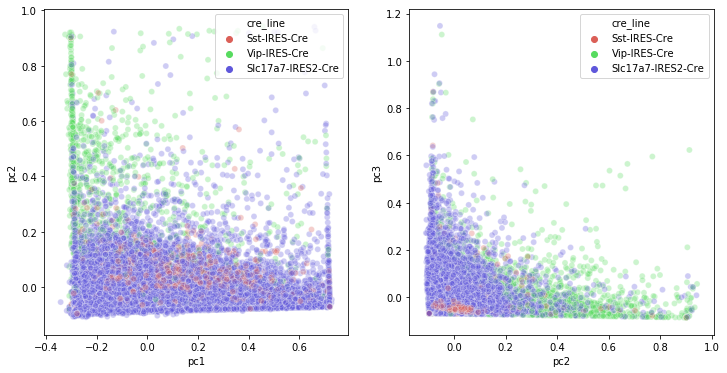

In [154]:
# pc1 and pc2 columns in rspm correspond to pca_results for those PCs - is this the 'score' per cell? 
fig,ax = plt.subplots(1,2,figsize=(12,6))
ax[0] = sns.scatterplot(data=data, x="pc1", y="pc2", hue="cre_line",
    palette=sns.color_palette("hls", 3), legend="full", alpha=0.3, ax=ax[0])
# ax[0].set_xlim(-5,10)
# ax[0].set_ylim(-5,10)

ax[1] = sns.scatterplot(data=data, x="pc2", y="pc3", hue="cre_line",
    palette=sns.color_palette("hls", 3), legend="full", alpha=0.3, ax=ax[1])
# ax[1].set_xlim(-5,10)
# ax[1].set_ylim(-5,10)

In [155]:
pca_result_df = pd.DataFrame(pca_result, index=data.identifier)
pca_result_df['cre_line'] = data['cre_line'].values

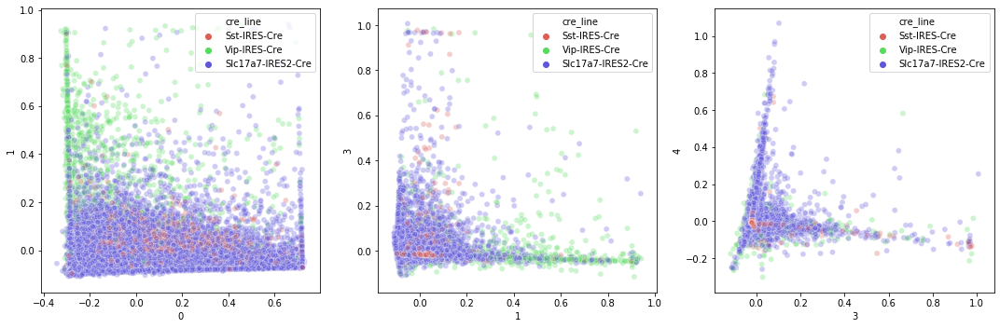

In [156]:
# pc1 and pc2 columns in rspm correspond to pca_results for those PCs - is this the 'score' per cell? 

PC1 = 0
PC2 = 1
PC3 = 3
PC4 = 4

fig,ax = plt.subplots(1, 3, figsize=(15,5))
ax = ax.ravel()
i=0
ax[i] = sns.scatterplot(data=pca_result_df, x=PC1, y=PC2, hue="cre_line",
    palette=sns.color_palette("hls", 3), legend="full", alpha=0.3, ax=ax[i])
# ax[i].set_xlim(-100,100)
# ax[i].set_ylim(-100,100)
i+=1
ax[i] = sns.scatterplot(data=pca_result_df, x=PC2, y=PC3, hue="cre_line",
    palette=sns.color_palette("hls", 3), legend="full", alpha=0.3, ax=ax[i])
# ax[i].set_xlim(-100,100)
# ax[i].set_ylim(-100,100)
i+=1
ax[i] = sns.scatterplot(data=pca_result_df, x=PC3, y=PC4, hue="cre_line",
    palette=sns.color_palette("hls", 3), legend="full", alpha=0.3, ax=ax[i])
# ax[i].set_xlim(-100,100)
# ax[i].set_ylim(-100,100)

fig.tight_layout()

In [157]:
query_string = '''pc1>-100 and pc1<100 and pc2>-100 and pc2<100 and pc3>-100 and pc3<100'''
fig = px.scatter_3d(
    data.query(query_string), 
    x='pc1', 
    y='pc2', 
    z='pc3',
    color='cre_line',
)
fig.update_traces(
    marker=dict(
        size=3,
        opacity=0.25
    )
)
fig.update_layout(
    margin=dict(l=30, r=30, t=10, b=10),
    width=1200,
    height=1000,
)
# fig.write_html("/home/dougo/code/dougollerenshaw.github.io/figures_to_share/2020.08.09_PCA_on_GLM.html")
# fig.show()

In [42]:
# # pc1 and pc2 columns in rspm correspond to pca_results for those PCs - is this the 'score' per cell? 
# fig,ax = plt.subplots(n_components, n_components, figsize=(20,20))
# ax = ax.ravel()
# i = 0
# for PC1 in range(n_components): 
#     for PC2 in range(n_components): 
#         ax[i] = sns.scatterplot(data=pca_result_df, x=PC1, y=PC2, hue="cre_line",
#             palette=sns.color_palette("hls", 3), legend="full", alpha=0.3, ax=ax[i])
#         ax[i].set_xlim(-100,100)
#         ax[i].set_ylim(-100,100)

# # ax[1] = sns.scatterplot(data=rspm, x="pc2", y="pc3", hue="cre_line",
# #     palette=sns.color_palette("hls", 3), legend="full", alpha=0.3, ax=ax[1])
# # ax[1].set_xlim(-100,100)
# # ax[1].set_ylim(-100,100)

## cluster with k-means

### cluster on feature matrix 

Text(0.5, 1, 'GLM feature matrix')

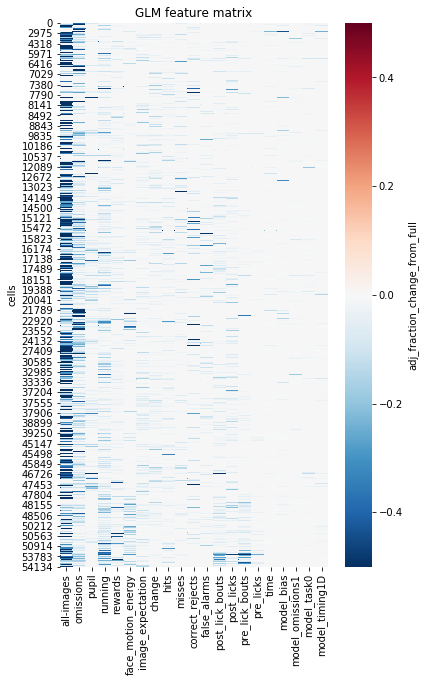

In [160]:
feature_matrix = data[cols_for_clustering]
fig, ax = plt.subplots(figsize=(6,10))
ax = sns.heatmap(feature_matrix, vmin=-0.5, vmax=0.5, cmap='RdBu_r', ax=ax, cbar_kws={'label':model_output_type})
ax.set_ylabel('cells')
ax.set_title('GLM feature matrix')

In [162]:
kmeans = KMeans(n_clusters=10)
kmeans_result = kmeans.fit_predict(feature_matrix)
data['kmeans_result_features'] = kmeans_result
data['kmeans_result_features'].value_counts()

C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



1    5788
7    2915
3    2869
4    2373
2    2309
6    1275
5     740
0     310
9     219
8     117
Name: kmeans_result_features, dtype: int64

### cluster on PCA results 

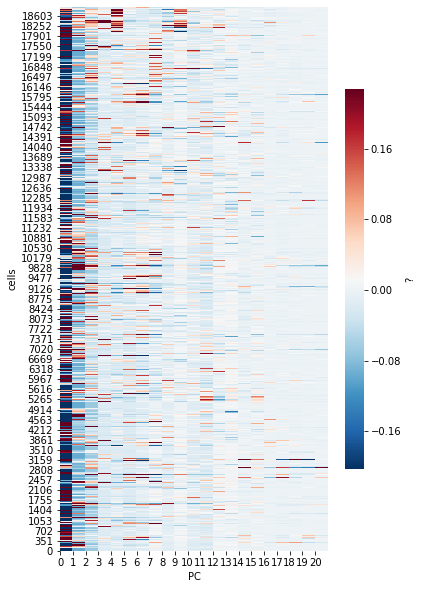

In [167]:
fig, ax = plt.subplots(figsize=(6,10))
ax = sns.heatmap(pca_result, cmap='RdBu_r', ax=ax, 
                 robust=True, cbar_kws={"drawedges": False, "shrink": 0.7, "label": '?'})
ax.set_ylabel('cells')
ax.set_xlabel('PC')
ax.set_title('')
ax.set_ylim(0, pca_result.shape[0])
ax.set_xlim(0, pca_result.shape[1])
ax.set_xticks(np.arange(0, pca_result.shape[1]));
# ax.set_xticklabels(cols_for_clustering, rotation=90);

In [ ]:
kmeans = KMeans(n_clusters=10)
kmeans_result = kmeans.fit_predict(pca_result)
rspm['kmeans_result'] = kmeans_result
rspm['kmeans_result'].value_counts()

"Then we applied consensus clustering to the PCs, by running K-means using the PCs 100 times until reaching a stable co-clustering association matrix, where each entry represents the probability of two units belonging to the same cluster." - Xiaoxuan paper

### try seaborn clustermap

In [168]:
data.cre_line.unique()

array(['Sst-IRES-Cre', 'Vip-IRES-Cre', 'Slc17a7-IRES2-Cre'], dtype=object)

In [181]:
cre_lines

,cre_line
0,Sst-IRES-Cre
1,Sst-IRES-Cre
2,Sst-IRES-Cre
3,Sst-IRES-Cre
4,Sst-IRES-Cre
...,...
55273,Sst-IRES-Cre
55274,Sst-IRES-Cre
55275,Sst-IRES-Cre
55276,Sst-IRES-Cre


In [185]:
data = rspm.dropna()

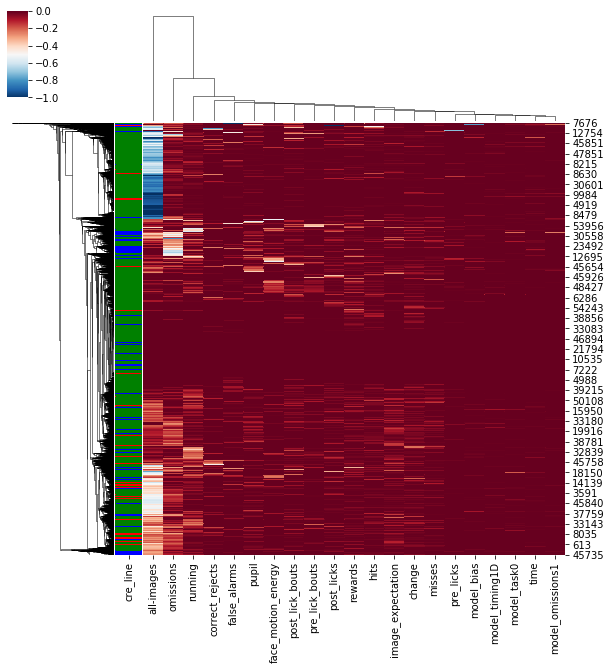

In [199]:
# fig, ax = plt.subplots(figsize=(6,10))

tmp = data.copy()
cre_lines = tmp.pop('cre_line')
lut = dict(zip(cre_lines.unique(), "rbg"))
row_colors = cre_lines.map(lut)


ax = sns.clustermap(data[cols_for_clustering], cmap='RdBu_r', row_colors=row_colors)
# ax.set_ylabel('cells')
# ax.set_xlabel('PC')
# ax.set_title('')
# ax.set_ylim(0, pca_result.shape[0])
# ax.set_xlim(0, pca_result.shape[1])
# ax.set_xticks(np.arange(0, pca_result.shape[1]));
# ax.set_xticklabels(cols_for_clustering, rotation=90);